# Vogelmodel: Some fast CNNs for bird classification
Vogel is Dutch for bird, hence the name essentially means bird model. In this notebook I train a couple of CNNs on 60.000 photos that I scraped earlier (see vogelscraper.ipynb). 

This notebook uses input from the following blogs and docs:
* https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html
* https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html (note that 'very little data' refers to 1000 samples per class..)

Author: Jeffrey Luppes (jeffluppes@gmail.com)

Accompanying blog: http://jeffluppes.github.io/2020/01/21/Building-a-bird-detector-from-scratch/

## Summary
This notebook first gathers images from folders and builds a datagenerators on top of these. The datagenerators (or datagens) are nice because you can 'stream' training data and perform augmentations on the original images. Images might be mirrored, or tilted by a couple of degrees to provide additional input. This is one way of coping with limited training data.

I try out three different models:
* A very simple CNN
* A still-still-very-simple but-slightly-larger CNN
* VGG16 without the fully-connected layers (e.g. I use VGG16 to generate features)

For each model I plot accuracy and loss. **I find that the bigger model works best under these circumstances**, which might be due to the niche: VGG16 wasn't trained to distinguish bird species, and the smaller model lacks the complexity to learn the features needed for this kind of classification. The accuracy hovers at around 60%. 

I evaluate also on some examples on my own photos. 

For the bigger model I calculate f1-scores and accuracy/precision per class. Additionally, I plot a confusion matrix which essentially illustrates just how much species are confusing for the model when they look alike :) 

Finally, I plot the filters of the convolutional neural network to try to understand what kind of geometry the model picks up on. 

This notebook is intended to be run on a GPU-enabled machine. **The scripts were executed on a Google Cloud Compute Engine running Jupyterhub, with access to a Nvidia Tesla K80 GPU.** While it is possible to do the same on a CPU I would not recommend it, as the training time is increased roughly 25x without a GPU. Scraping was done from another machine (you don't need a GPU for web scraping) and Google Cloud Storage was used as an impromptu repo to allow data transfer between both machines. 

## Improvements, TODOs, known issues...
This is not meant as the best possible model, but more of a first exploration. Some comments on improvements are mentioned throughout the notebook and I'm open to feedback. 

* Better models: seems obvious! Include some work from recent research seems like a good idea.
* Experiment with more data augmentations and data
* update the model calls to the keras 2 api and remove the warning supression..
* label all the plots and automatically scale their x and y axis
* Balance the data and normalize the confusion plots (6 classes have roughly 45% of the data)

## Setting up

In [5]:
#the usual suspects
import numpy as np
import pandas as pd 
import random
import os

#keras / tensorflow is my go-to deep learning library. I really should learn torch.
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization
from keras.applications import VGG16


#sklearn
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

#matplotlib for vizualisations
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#opencv
import cv2

# warnings to mute warnings due to deprecated methods being used left and right
import warnings

In [4]:
#some settings
IMAGE_WIDTH=224
IMAGE_HEIGHT=224
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=3

batch_size = 16

In [5]:
warnings.filterwarnings("ignore", category=DeprecationWarning)

## Data set splitting and data augmentation


In [6]:
labels = []
filenames = []

# create two lists with filenames and their labels 
# r=root, d=directories, f = files
for r, d, f in os.walk('../data/edited'):
    for file in f:

        if ".png" in file:
            labels.append(r.split('/')[4])
            filenames.append(os.path.join(r, file))
            pass

In [7]:
# conver the lists to a dataframe
df = pd.DataFrame({
    'filename': filenames,
    'label': labels
})

In [8]:
df.head()

,filename,label
0,../data/edited/edited/wielewaal/21004461.png,wielewaal
1,../data/edited/edited/wielewaal/16739613.png,wielewaal
2,../data/edited/edited/wielewaal/16916566.png,wielewaal
3,../data/edited/edited/wielewaal/20865274.png,wielewaal
4,../data/edited/edited/wielewaal/16617164.png,wielewaal


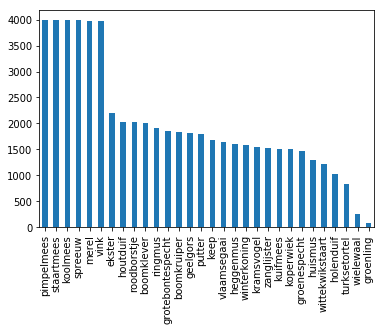

In [9]:
# show a quick graph breaking down the number of samples per species
df['label'].value_counts().plot.bar()

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60149 entries, 0 to 60148
Data columns (total 2 columns):
filename    60149 non-null object
label       60149 non-null object
dtypes: object(2)
memory usage: 940.0+ KB


In [11]:
# store the number of classes (used later for setting up the model)
num_classes = len(df.label.unique())

In [12]:
# 10% of the data will be used for a test set (a bit risky to say the least, but we dont have that much data)
df, test_df = train_test_split(df, test_size=0.1, random_state=42)

# of the remaining 90%, 20% will be for validation during development
train_df, validate_df = train_test_split(df, test_size=0.20, random_state=42)

train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

In [13]:
total_test = test_df.shape[0]
print('Total test samples: {}'.format(total_test))

Total test samples: 6015


In [14]:
total_train = train_df.shape[0]
print('Total training samples: {}'.format(total_train))

Total training samples: 43307


In [15]:
total_validate = validate_df.shape[0]
print('Total validation samples: {}'.format(total_validate))

Total validation samples: 10827


In [16]:
# set up a training datagen + generator that performs data augmentation on the go
# rescaling is needed to make sure that the colour values of each image are between 0 and 1
train_datagen = ImageDataGenerator(
    rotation_range=15,
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1
)

train_generator = train_datagen.flow_from_dataframe(
    train_df, 
    "", 
    x_col='filename',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 43307 validated image filenames belonging to 30 classes.


In [17]:
# Set up a validation datagenerator. No longer performing augmentations here.
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df, 
    "", 
    x_col='filename',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 10827 validated image filenames belonging to 30 classes.


In [18]:
# for testing I also use a test generator. Only real difference here is 
# that the data is not shuffled (as I want to compute metrics on the test data)
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    test_df, 
    "", 
    x_col='filename',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False
)

Found 6015 validated image filenames belonging to 30 classes.


## Models

In [17]:
def get_basic_cnn():
    '''Returns a very simple CNN as a keras model'''
    
    model = Sequential()

    model.add(Conv2D(32, (3, 3), input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(32, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(64, (3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
    model.add(Dense(64))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    model.add(Dense(num_classes, activation='softmax')) 
    model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

    model.summary()
    return model

In [18]:
def get_bigger_cnn_model():
    '''Returns a slightly bigger CNN as a keras model'''
    
    model = Sequential()

    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    
    model.add(Conv2D(256, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())
    model.add(Dense(1024, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(num_classes, activation='softmax')) 
    model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

    model.summary()
    return model

In [19]:
#get the model
model = get_basic_cnn()

#define callbacks to be used during model training
earlystop = EarlyStopping(patience=10)
checkpoint = ModelCheckpoint('intermediate_model', monitor='val_loss', verbose=0, save_best_only=True)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)
callbacks = [earlystop, learning_rate_reduction, checkpoint]

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 222, 222, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 109, 109, 32)      9248      
_________________________________________________________________
activation_2 (Activation)    (None, 109, 109, 32)      0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 54, 54, 32)        0         
______________________________________

In [20]:
#define the number of epochs for training
epochs=30

# train the model!
history = model.fit_generator(
    train_generator, 
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)


Epoch 1/30
2706/2706 [==============================] - 567s 210ms/step - loss: 3.2466 - accuracy: 0.0896 - val_loss: 2.9579 - val_accuracy: 0.1382
Epoch 2/30
2706/2706 [==============================] - 568s 210ms/step - loss: 3.1368 - accuracy: 0.1216 - val_loss: 2.9943 - val_accuracy: 0.1622
Epoch 3/30
2706/2706 [==============================] - 568s 210ms/step - loss: 3.0793 - accuracy: 0.1408 - val_loss: 2.6220 - val_accuracy: 0.1779
Epoch 4/30
2706/2706 [==============================] - 568s 210ms/step - loss: 3.0705 - accuracy: 0.1459 - val_loss: 2.6430 - val_accuracy: 0.1761
Epoch 5/30
2706/2706 [==============================] - 566s 209ms/step - loss: 3.0735 - accuracy: 0.1525 - val_loss: 3.2383 - val_accuracy: 0.1598

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
Epoch 6/30
2706/2706 [==============================] - 568s 210ms/step - loss: 3.0098 - accuracy: 0.1684 - val_loss: 2.8023 - val_accuracy: 0.1715
Epoch 7/30
2706/2706 [========

In [21]:
# store the weights (smaller)
model.save_weights("small_cnn_weights.h5")

# Save the model
model.save('small_model_full.h5')

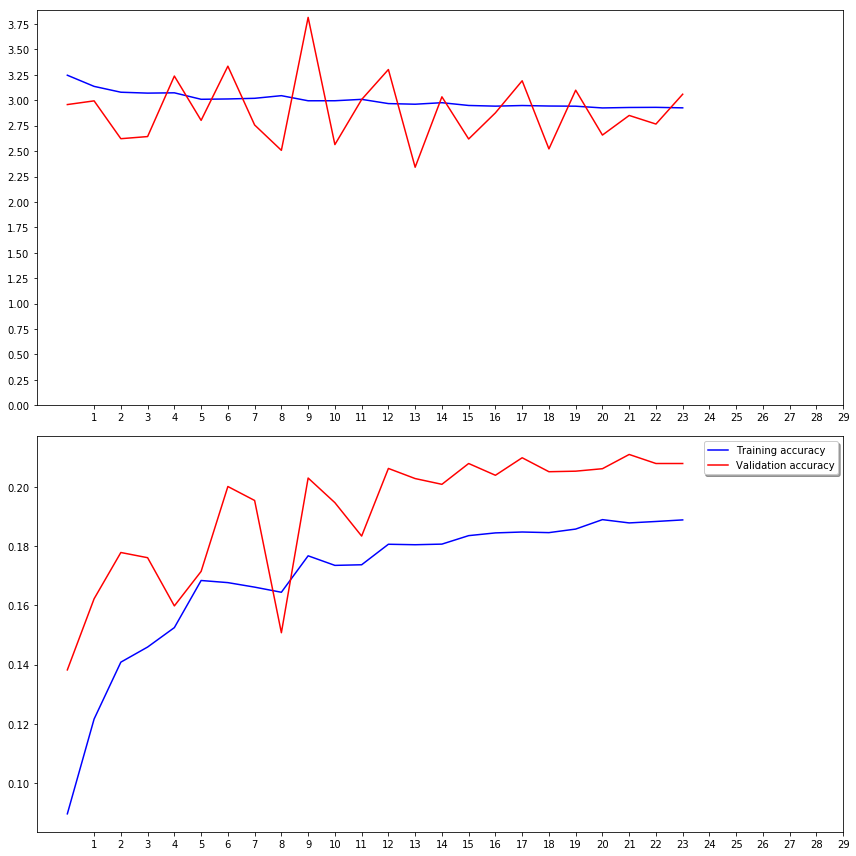

In [22]:
#show graphs of training statistics
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(history.history['loss'], color='b', label="Training loss")
ax1.plot(history.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))
ax1.set_yticks(np.arange(0,4, 0.25))

ax2.plot(history.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

## A slightly bigger CNN

In [23]:
#now grab the bigger model I defined earlier and define callbacks
bigger_model = get_bigger_cnn_model()
earlystop = EarlyStopping(patience=3)
checkpoint = ModelCheckpoint('bigger_model', monitor='val_loss', verbose=0, save_best_only=True)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)
callbacks = [earlystop, learning_rate_reduction, checkpoint]

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 222, 222, 32)      896       
_________________________________________________________________
batch_normalization_1 (Batch (None, 222, 222, 32)      128       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 111, 111, 32)      0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 109, 109, 64)      18496     
_________________________________________________________________
batch_normalization_2 (Batch (None, 109, 109, 64)      256       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 54, 54, 64)       

In [24]:
# commence training
history2 = bigger_model.fit_generator(
    train_generator, 
    epochs=50,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/50
2706/2706 [==============================] - 585s 216ms/step - loss: 3.6971 - accuracy: 0.0896 - val_loss: 3.6015 - val_accuracy: 0.1329
Epoch 2/50
2706/2706 [==============================] - 584s 216ms/step - loss: 3.0763 - accuracy: 0.1638 - val_loss: 2.8783 - val_accuracy: 0.2509
Epoch 3/50
2706/2706 [==============================] - 583s 215ms/step - loss: 2.8088 - accuracy: 0.2248 - val_loss: 2.6320 - val_accuracy: 0.2826
Epoch 4/50
2706/2706 [==============================] - 585s 216ms/step - loss: 2.6239 - accuracy: 0.2704 - val_loss: 2.7439 - val_accuracy: 0.3216
Epoch 5/50
2706/2706 [==============================] - 585s 216ms/step - loss: 2.4908 - accuracy: 0.3090 - val_loss: 1.9242 - val_accuracy: 0.3176
Epoch 6/50
2706/2706 [==============================] - 585s 216ms/step - loss: 2.3737 - accuracy: 0.3392 - val_loss: 3.2032 - val_accuracy: 0.3417
Epoch 7/50
2706/2706 [==============================] - 585s 216ms/step - loss: 2.2816 - accuracy: 0.3626 - val_

In [25]:
# Save the model weights (smaller)
bigger_model.save_weights("bigger_cnn_weights.h5")

# Save the model
bigger_model.save('bigger_model_full.h5')

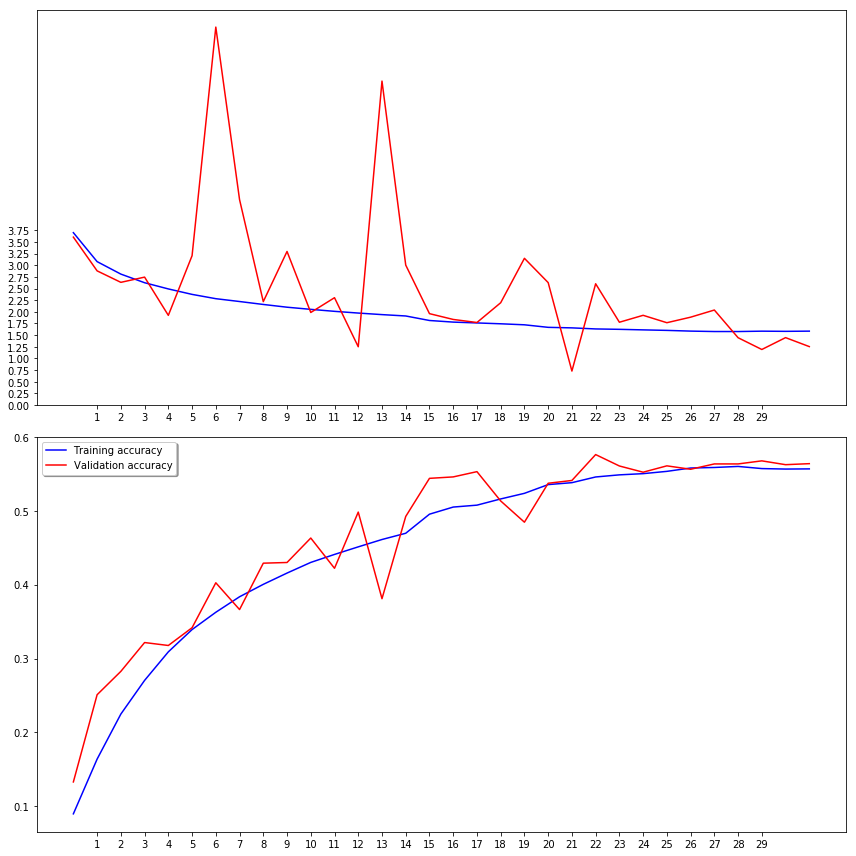

In [26]:
# plot graphs of the training metrics
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(history2.history['loss'], color='b', label="Training loss")
ax1.plot(history2.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))
ax1.set_yticks(np.arange(0, 4, 0.25))

ax2.plot(history2.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(history2.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

## VGG16 
VGG16 is a huge network and made quite a buzz about five years ago. Its weights were made available and have been incorperated into Keras. As of such, I can access the model via the Keras API and select only the convolutional layers. While this means that I can effectively work with any image size, I've opted to work with the same image formats for simplicity.

In [27]:
from keras.applications import VGG16
from keras.layers import Input
from keras.models import Model
from keras.optimizers import SGD

earlystop = EarlyStopping(patience=10)
checkpoint = ModelCheckpoint('vgg_model', monitor='val_loss', verbose=0, save_best_only=True)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)
callbacks = [earlystop, learning_rate_reduction, checkpoint]

def get_vgg16_top():
    input_tensor = Input(shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))
    
    # grab only the convolutional layers and not the fully-connected layers
    base_model = VGG16(weights="imagenet", input_tensor=input_tensor, include_top=False)

    # add a dense layer on top
    x = base_model.output
    x = Flatten()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(input=base_model.input, output=predictions)

    for layer in base_model.layers:
        layer.trainable = False

    model.compile(optimizer=SGD(lr=1e-4, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
    model.summary()
    
    return model

# grab the model defined above
vgg = get_vgg16_top()

# train it, ralph!
history3 = vgg.fit_generator(
    train_generator,
    epochs=50,
    validation_data=validation_generator,
    callbacks=callbacks
)


/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:25: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("de...)`


Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [28]:
# Save the model weights (smaller)
vgg.save_weights("vgg_weights.h5")

# Save the model
vgg.save('vgg_model_full.h5')

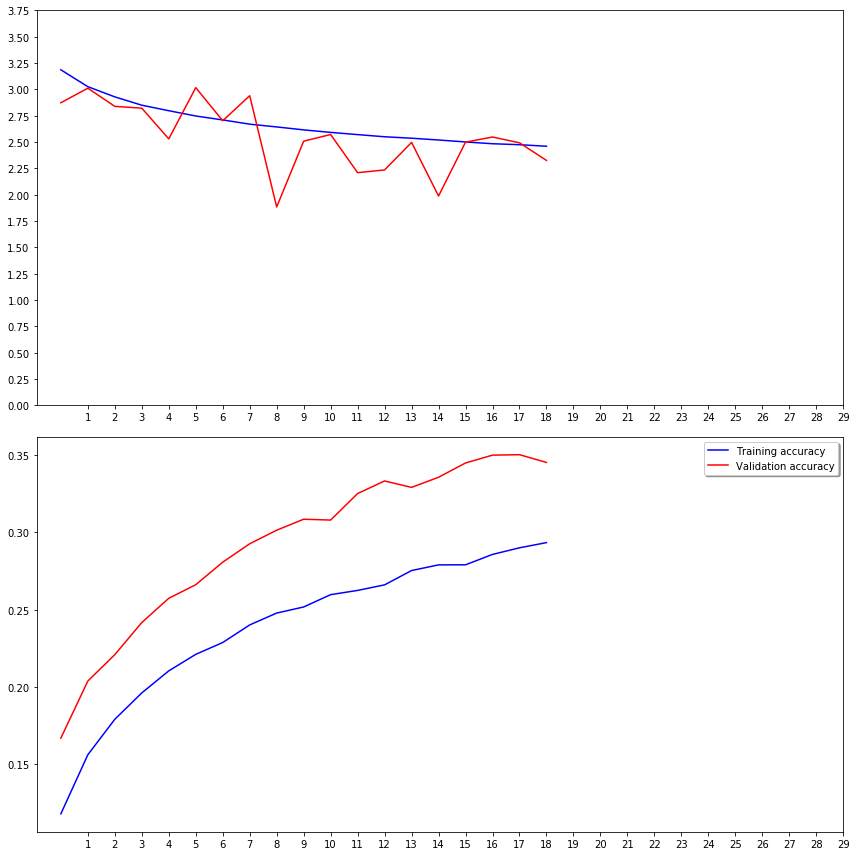

In [29]:
# plot metrics once more
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(history3.history['loss'], color='b', label="Training loss")
ax1.plot(history3.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))
ax1.set_yticks(np.arange(0, 4, 0.25))

ax2.plot(history3.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(history3.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

## Testing - which model performs best on unseen data?
For this part I used the test generator from before. Not surprisingly the best model during training also was the best model on the test data.

In [19]:
#load models if re-starting the notebook and not interested in retraining

from keras.models import load_model

model = load_model('small_model_full.h5')
bigger_model = load_model('bigger_model_full.h5')
vgg = load_model('vgg_model_full.h5')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.




In [20]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

In [21]:
models = model, bigger_model, vgg
names = 'simple cnn', 'bigger cnn', 'vgg16-finetuned'

for idx, m in enumerate(models):
    Y_pred = m.predict_generator(test_generator)
    y_pred = np.argmax(Y_pred, axis=1)
    y_val = test_generator.classes

    avg = 'weighted'
    print('Scores for {}:'.format(names[idx]))
    
    #print the accuracy score
    print('accuracy: {}'.format(accuracy_score(y_val, y_pred)))

    #add prediction results to dataframe
    print('f1-score: {}'.format(f1_score(y_val, y_pred, average=avg)))
    print('recall: {}'.format(recall_score(y_val, y_pred, average=avg)))
    print('precision: {}'.format(precision_score(y_val, y_pred, average=avg)))
    print('\n')

Scores for simple cnn:
accuracy: 0.200332502078138
f1-score: 0.15331467484067587
recall: 0.200332502078138
precision: 0.16070675042980487




/usr/local/lib/python3.5/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Scores for bigger cnn:
accuracy: 0.5644222776392352
f1-score: 0.578207431425068
recall: 0.5644222776392352
precision: 0.6275780396941839


Scores for vgg16-finetuned:
accuracy: 0.33915211970074816
f1-score: 0.30856467201201704
recall: 0.33915211970074816
precision: 0.3754690038669624




All right, so the bigger model is the better one.. lets draft up a proper classification report and break down the score per species.

In [22]:
Y_pred = bigger_model.predict_generator(test_generator)
y_pred = np.argmax(Y_pred, axis=1)

classnames = sorted([x for x in test_generator.class_indices])
mat = confusion_matrix(test_generator.classes, y_pred)
print(classification_report(test_generator.classes, y_pred, target_names=classnames))

                  precision    recall  f1-score   support

      boomklever       0.73      0.62      0.67       205
     boomkruiper       0.46      0.69      0.55       195
          ekster       0.61      0.71      0.66       213
        geelgors       0.70      0.58      0.63       174
    groenespecht       0.61      0.61      0.61       137
       groenling       0.00      0.00      0.00        10
grotebontespecht       0.86      0.51      0.64       186
       heggenmus       0.57      0.32      0.41       144
       holenduif       0.47      0.21      0.29       107
        houtduif       0.32      0.64      0.42       180
         huismus       0.53      0.28      0.37       135
            keep       0.97      0.35      0.52       196
        koolmees       0.79      0.67      0.72       378
       koperwiek       0.47      0.27      0.34       143
      kramsvogel       0.21      0.31      0.25       157
        kuifmees       0.52      0.55      0.54       156
           me

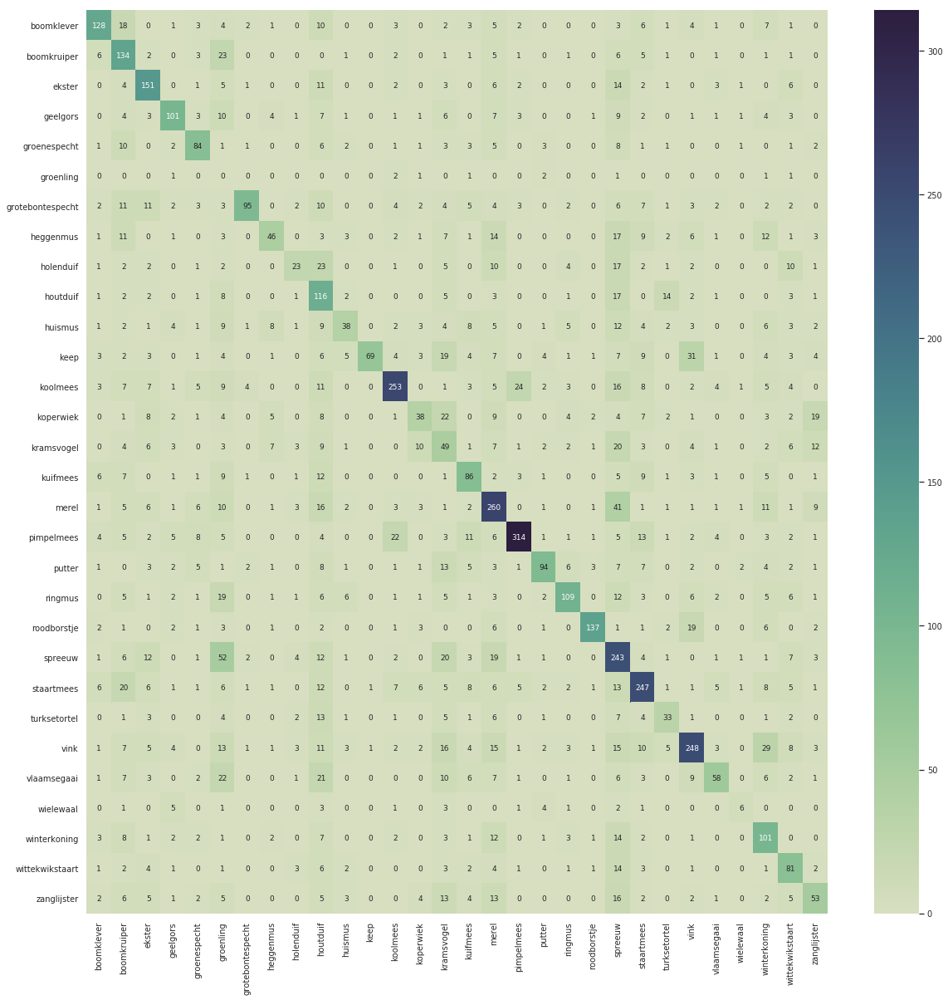

In [28]:
cmap = sns.cubehelix_palette(8, start=.5, rot=-.75, as_cmap=True)

df_cm = pd.DataFrame(mat, classnames, classnames)
plt.figure(figsize=(20,20))
sns.set(font_scale=0.9) # for label size
sns.heatmap(df_cm, annot=True, annot_kws={"size": 9}, fmt='d', cmap=cmap) # font size

plt.show()

### Discussion on the basis of the confusion plot
I should be careful with a small test set like this, but I feel like a limited survey is fine. The confusion plot above shows that the model has trouble with some bird species that are also easily confused in the actual field. The blue and great tit (*pimpelmees and koolmees*) look a like so they're confused often, similarly, the three pigeon species also have some overlap as do the *fringilla* . The Turdus group (which includes the *kramsvogel*, the *merel* and the *zanglijster* are confused a lot, but they also get missclassified as a *spreeuw* which has a similar looking posture and chest albeit slightly different coloring. Some prominent mishaps are around the *wielewaal* and the *groenling*. Looking at the support from the classification report, there was not enough data for the model to learn to distinguish these. 

## Personal test images.
What found would this be if I couldn't test it on some real photos? Below are some of my own photos.

First I import some of the methods I used in the scraping script to pre-process the images:

In [29]:
def center_image(img):
    '''Convenience function to return a centered image'''
    size = [256,256]
    
    img_size = img.shape[:2]
    
    # centering
    row = (size[1] - img_size[0]) // 2
    col = (size[0] - img_size[1]) // 2
    resized = np.zeros(list(size) + [img.shape[2]], dtype=np.uint8)
    resized[row:(row + img.shape[0]), col:(col + img.shape[1])] = img

    return resized

In [30]:
def convert_and_store_img(inputpath: str, outputpath: str):
    '''Converts an image and resizes it, stores it to csv'''
    try:
        img = cv2.imread(inputpath)

        #opencv uses bgr instead of rgb, this is a quick conversion to fix this
        #img = img[:,:,::-1]

        #resize
        if(img.shape[0] > img.shape[1]):
            tile_size = (int(img.shape[1]*256/img.shape[0]),256)
        else:
            tile_size = (256, int(img.shape[0]*256/img.shape[1]))

        #centering
        img = center_image(cv2.resize(img, dsize=tile_size))

        #output should be 224*224px for a quick vggnet16
        img = img[16:240, 16:240]

        cv2.imwrite(outputpath, img)
    except AttributeError as e:
        print(inputpath)
        print(e)

In [31]:
#get the images in the test directory
imgs = os.listdir('testimgs')

#just a quick list comprehension to weed out notebook checkpoints and temp files
testimgs = [img for img in imgs if '.jpg' in img.lower()]

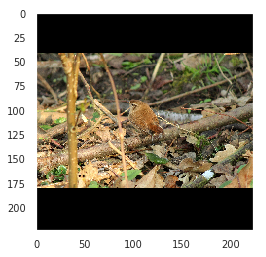

verdict: winterkoning (0.5016022324562073 confidence)


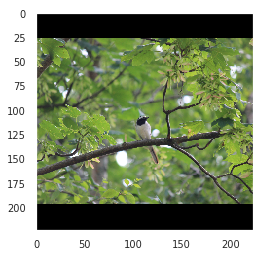

verdict: staartmees (0.8969266414642334 confidence)


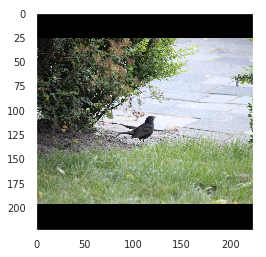

verdict: merel (0.2945193648338318 confidence)


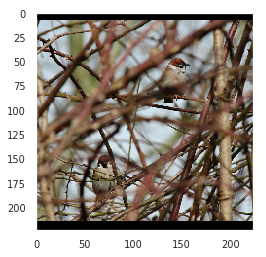

verdict: ringmus (0.7962145209312439 confidence)


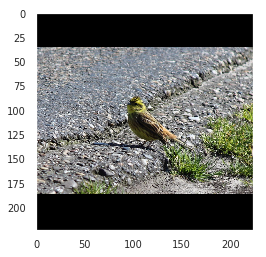

verdict: pimpelmees (0.309772789478302 confidence)


In [34]:
for testimg in testimgs:
    # show the raw image
    #img=mpimg.imread('testimgs/'+testimg)
    #imgplot = plt.imshow(img)
    #plt.show()
    
    # show the centered and 224x224 version
    # todo refactor it to use in-memory storage
    convert_and_store_img('testimgs/'+testimg, 'testimgs/temp.png')
    img=mpimg.imread('testimgs/temp.png')
    imgplot = plt.imshow(img)
    # toggle to remove the grid from photo plots
    plt.grid()
    plt.show()
    
    # get a prediction on this image
    preds = bigger_model.predict(np.expand_dims(img,0))

    print('verdict: {} ({} confidence)'.format(classnames[preds.argmax(axis=-1)[0]], preds[0][np.argmax(preds)]))

Whoa! Out of five images the model correctly labels three. Not bad considering these are home-made images. I'm particularly impressed by the correct *winterkoning* label. I had assumed the bird to be labelled as a *heggemus* by the model. 

The images that the model failed to adequately predict are the *witte kwikstaart* (image 2) and the *geelgors* (image 5). Image two got labelled as a staartmees (long-tailed tit), which is a small bird that does share a resemblance with the *witte kwikstaart*. Both have a long tail and white coloured feathers. For image 5 the model incorrectly assumed the bird to be a *pimpelmees* (blue tit), which is also a similar-looking bird, having yellow tones like the *geelgors*. 

## Bonus: Showing model activation maps
I figured that it might be possible to derive some of the bird geometry from whatever is captured by the convolutional layers. Below is a small exploration with that, based on http://blog.keras.io/how-convolutional-neural-networks-see-the-world.html. This is very similar to the viral 'deep dreams' images that pop up a lot. 

I use a modified version of the script and packaged it as a seperate `.py` which is imported here.

In [35]:
# get the symbolic outputs of each "key" layer (we gave them unique names).
layer_dict = dict([(layer.name, layer) for layer in bigger_model.layers])

In [36]:
#show which conv layers I can choose from
layer_dict

{'batch_normalization_1': <keras.layers.normalization.BatchNormalization at 0x7f1dc00e20f0>,
 'batch_normalization_2': <keras.layers.normalization.BatchNormalization at 0x7f1dc3602f28>,
 'batch_normalization_3': <keras.layers.normalization.BatchNormalization at 0x7f1dc0bf1978>,
 'batch_normalization_4': <keras.layers.normalization.BatchNormalization at 0x7f1dc0bab0f0>,
 'batch_normalization_5': <keras.layers.normalization.BatchNormalization at 0x7f1dc0b4ef28>,
 'conv2d_4': <keras.layers.convolutional.Conv2D at 0x7f1dc00dd828>,
 'conv2d_5': <keras.layers.convolutional.Conv2D at 0x7f1dc0bc7f60>,
 'conv2d_6': <keras.layers.convolutional.Conv2D at 0x7f1dc0beed30>,
 'conv2d_7': <keras.layers.convolutional.Conv2D at 0x7f1dc0b83c50>,
 'dense_3': <keras.layers.core.Dense at 0x7f1dc0b49f28>,
 'dense_4': <keras.layers.core.Dense at 0x7f1dc0b60c88>,
 'dropout_2': <keras.layers.core.Dropout at 0x7f1dc00e25f8>,
 'dropout_3': <keras.layers.core.Dropout at 0x7f1dc0bd9c50>,
 'dropout_4': <keras.layers

In [37]:
# force reload of a module, needed because I added the py script to this dir
# and edited it. Original taken from Keras blog (mentioned in header)
import importlib
import conv_viz
#importlib.reload(conv_viz)

In [ ]:
# quick and dirty method to store the visualisation to disk as a png image
# pick the last three conv layers
# todo: refactor this to just return the image
conv_viz.visualize_layer(bigger_model, 'conv2d_5')
conv_viz.visualize_layer(bigger_model, 'conv2d_6')
conv_viz.visualize_layer(bigger_model, 'conv2d_7')

37 filters processed.
31 filters processed.


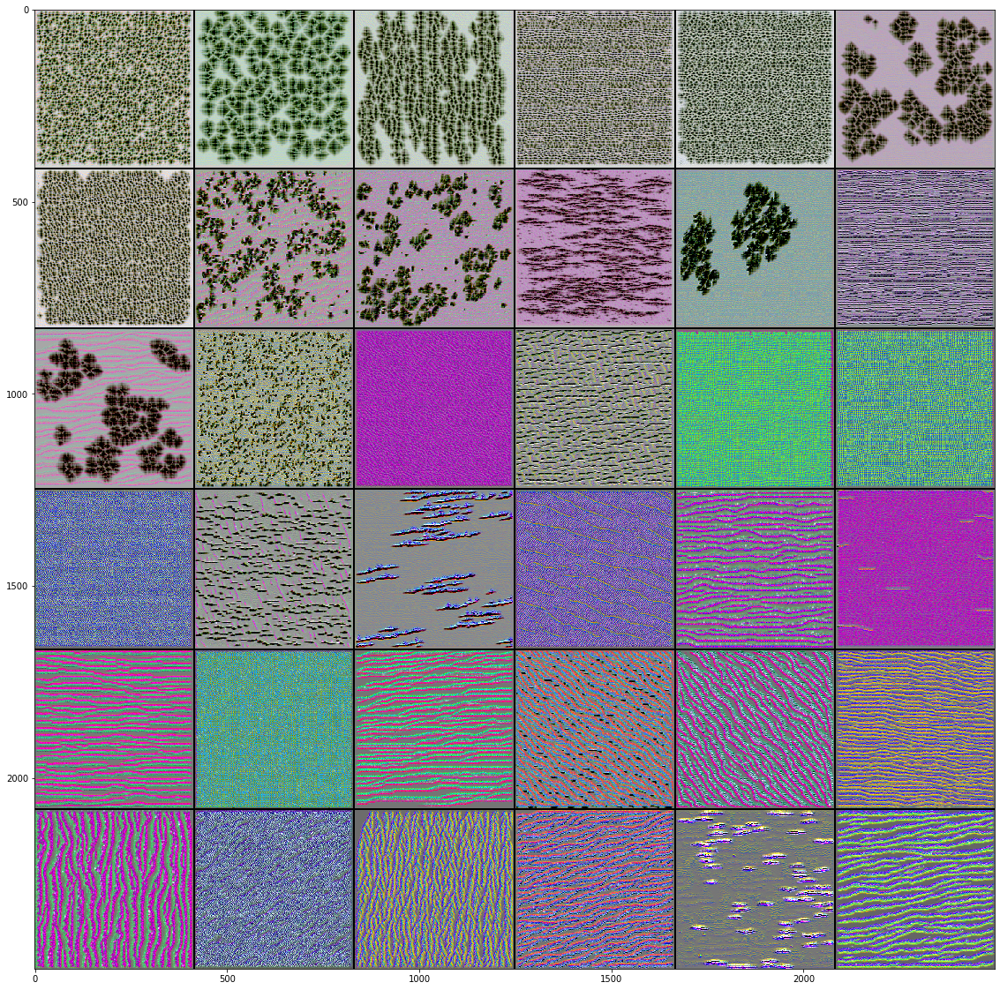

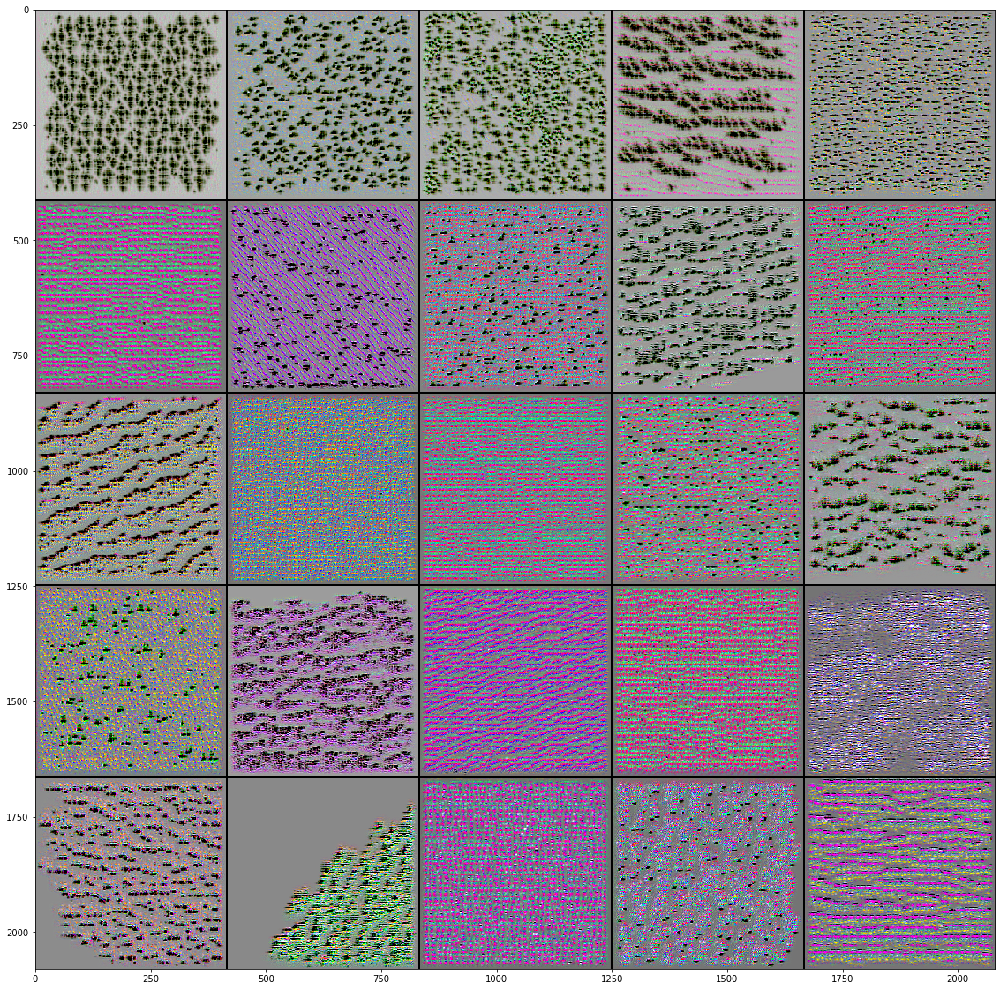

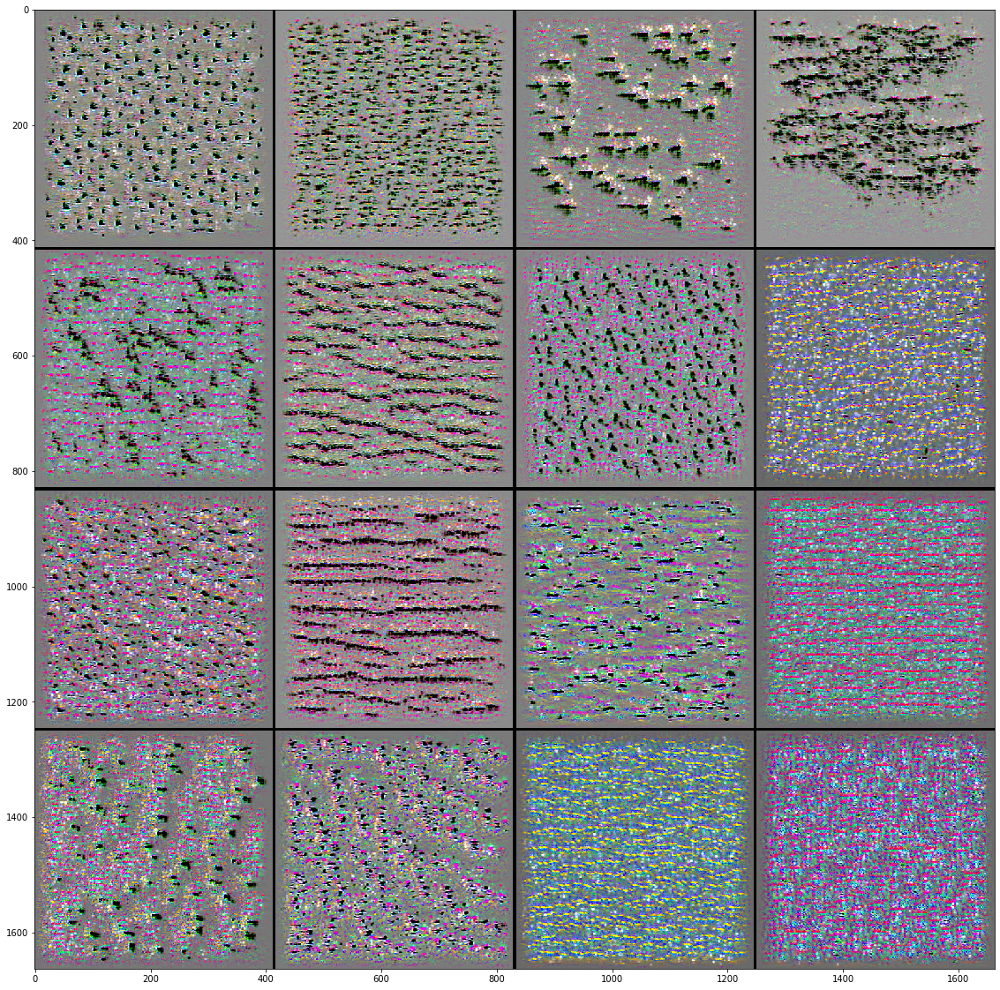

In [6]:
# these are the images produced by the call above and stored on disk
images = 'model_conv2d_5_6x6.png', 'model_conv2d_6_5x5.png', 'model_conv2d_7_4x4.png'

# plot these in the notebook
for i in images:
    plt.figure(figsize=(20,20))
    image = mpimg.imread(i)
    plt.imshow(image)

## Great, so what does this tell us?
Not a whole bunch right? Wave and tree-like patterns are dominant, typically rotated in 90 degree angles, as with most CNN visualisations. It seems that the lowest layer might be learning to model posture and textures while higher layers look for more coarse structures such as multiple birds per picture or the combination of colours in a bird's plumage. This might also explain why the model is overfitting albeit slightly towards the 'Spreeuw' class (common starling) because those birds are almost exclusively captured in flocks. At any rate, it is intriguing to see and it would be nice to revisit this topic with a well-trained model.